In [30]:
import pathlib
import random
import copy
import gc
import numpy as np
import torch
import torchvision
import quantus
import torchvision
from captum.attr import *
import matplotlib.pyplot as plt
from omegaconf import OmegaConf
import yaml
import argparse

from models.s4net import S4PatchedFinalNet,TrunkNet, HeadNet
from data.data_loader import load_eeg_data, get_sliding_window_data, create_dataloader
import os
import mne
from tqdm import tqdm
from scipy.signal import hilbert
from sklearn.preprocessing import MinMaxScaler
from scipy.io import loadmat
from tqdm import tqdm

from pycircstat.tests import *
import statsmodels.multivariate.multivariate_ols as mv_ols
import statsmodels.api as sm 
import pandas as pd

In [31]:
CFG_YAML = """
wandb:
 key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model:
dataset:
 data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
 #file_name: subject_{:03d}_preprocessed_combined_py.fif
 file_name: subject_{:03d}_preprocessed_combined_py.fif
 exclude_timepoints: 100
 subject_index: 1
 test_subject_indices: [1,2,13,24,29,34,42,43,52,60,62,67,69,80]
 #test_subject_indices: [2]
training:
 training_start_len: 100
 pretrain_epochs: 100
 pretrain_lr: 0.0001
 val_window_len: 1
 epochs_per_window: 10
 num_warmup_epochs: 5
 num_epochs: 800
 slide_step: 1
 num_warmup_epochs_per_window: 0
 lr: 0.005 #maybe change back to 0.0001
 nll_beta: 0.001
 num_warmup_epochs: 0
 batch_size: 50 #better to use 50
 random_seed: 42
 precision: bf16
 kde_lambda: 0.5
 finetune_entire_model: true # Set to true to finetune the entire model, false for transformer only
exp_name: S4_S4EEGNet_ema
"""

def load_config():
    cfg = OmegaConf.create(yaml.safe_load(CFG_YAML))
    cfg.exp_name = f"{cfg.exp_name}_subject_{cfg.dataset.subject_index}"
    return cfg

def parse_args():
    parser = argparse.ArgumentParser()
    parser.add_argument("--update_conf", nargs="*", help="Updates to the configuration in the form of key=value pairs", default=[])
    parser.add_argument("-f", "--fff", help="A dummy argument to handle IPython's default argument", default="1")
    return parser.parse_args()

def update_config(cfg, cli_args):
    for update in cli_args.update_conf:
        key, value = update.split("=")
        try:
            value = eval(value)
        except:
            pass
        OmegaConf.update(cfg, key, value, force_add=True)
    cfg.exp_name = cfg.exp_name + "_" + "_".join(cli_args.update_conf)
    print(OmegaConf.to_yaml(cfg))
    return cfg


def save_config(cfg):
    os.makedirs("conf/sweeps", exist_ok=True)
    os.makedirs("exp/withinsubs", exist_ok=True)
    with open(f"conf/sweeps/withinsubs_{cfg.exp_name}.yaml", "w") as f:
        f.write(OmegaConf.to_yaml(cfg))

In [32]:
cfg = load_config()

subject_index = cfg.dataset.test_subject_indices[0]
cfg.dataset.subject_index = subject_index
cfg.exp_name = f"S4_S4EEGNet_ema_100_cal_py_{cfg.dataset.subject_index}"
cli_args = parse_args()
cfg = update_config(cfg, cli_args)
save_config(cfg)
all_epochs, labels_raw, _, _, _, _, _, ch_names = load_eeg_data(cfg)
all_epochs = all_epochs[150:]
labels_raw = labels_raw[150:]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_shape_st = (60, 900)

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 1
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_1_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif ...
    Found the data of interest:
       

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)


In [33]:
# award importance to a channel according to their importance ranking in a time point
def update_channel_points_linear(top_k_channel_names, channel_point_dict):
    for i, channel_name in enumerate(top_k_channel_names):
        channel_point_dict[channel_name] += 10-i
    return channel_point_dict

# award importance to a channel according to their importance ranking in a time point
def update_channel_points_same(top_k_channel_names, channel_point_dict):
    for i, channel_name in enumerate(top_k_channel_names):
        channel_point_dict[channel_name] += 1
    return channel_point_dict

def get_top_k_channels_per_timepoint(time_point_data, ch_names, k):
    # trial is of shape channels x timepoins
    # for each timepoint, find indices of top_k channels with highest activations 
    top_k_channels_indices = np.argsort(time_point_data)[::-1][:k]
    # get the channel names of the top_k channels 
    top_k_channels_names = np.take(ch_names, top_k_channels_indices)
    #print(top_k_channels_names)
    return top_k_channels_names


# adapt so you can see a running list of top channes per trial
def get_top_k_channels_per_trial(trial, ch_names, channel_point_dict , k, update_func):
    for time_point in range(trial.shape[1]):
        #print(f"time_point: {time_point}")
        top_k_channel_names = get_top_k_channels_per_timepoint(trial[:,time_point], ch_names, k)
        # update the points of the top_k channels of the timepoint according to the (linear, stricly monotone falling) update function
        # 
        # NOTE while assumption that all trials are equally important holds, assumption that all timepoints are equally important is very questionable. 
        # Maybe think about this part again
        channel_point_dict = update_func(top_k_channel_names, channel_point_dict)
    return channel_point_dict

def get_top_k_channels(aggregate_dict, aggregate_dict_key, ch_names, k, update_func):
    # get the channel importance for each channel according to the explanation method
    # a ranking approach is chosen s.t. each timepoint in a trial and each trial is equally important

    # init dict for storing points per channel

    channel_point_dicts_over_time = []

    channel_point_dict = {}
    for ch in ch_names:
        channel_point_dict[ch] = 0
    
    data = aggregate_dict[aggregate_dict_key].squeeze()
    # go through each trial in the dataset and assign points for each
    for trial in data:
        #print(trial.shape)
        channel_point_dict = get_top_k_channels_per_trial(trial, ch_names, channel_point_dict, k, update_func)
        channel_point_dicts_over_time.append(copy.deepcopy(channel_point_dict))
        #print(channel_point_dicts_over_time)
    
    top_k_channels = sorted(channel_point_dict, key=channel_point_dict.get, reverse=True)[:k]
    return top_k_channels, channel_point_dicts_over_time
    
def format_point_progression(point_progressions, ch_names):
    # this function collects the points over time per channel properly s.t. the point progression over time can easily be plotted
    point_progression_dict = {}
    for ch in ch_names:
        point_progression_dict[ch] = []


    for dict in point_progressions:
        for ch in ch_names:
            point_progression_dict[ch].append(dict[ch])

    return point_progression_dict



In [34]:
def top_k_channel_per_trial_weighted(trial, ch_names,  channel_points_dict, k, update_func, aggregation_func=np.mean, **kwargs):
    # aggregate the importances award to each "pixel" in the trial over the time_point dimension according to the provided aggreagation_func
    #print(trial.shape)
    agg_points_per_channel = aggregation_func(trial, **kwargs)

    #print(agg_points_per_channel.shape)
    # get the indices of the top k channels
    top_k_channels_indices = np.argsort(agg_points_per_channel)[::-1][:k]
    top_k_channels_names = np.take(ch_names, top_k_channels_indices)
    #print(top_k_channels_names)
    # update the channels points according to the provided update func
    channel_points_dict = update_func(top_k_channels_names, channel_points_dict)
    return channel_points_dict

def get_top_k_weighted(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices=np.array([])):
    #the previous top-k function considers each timepoint and each trial equally important.
    #in this version now each trial is still assumed to be equally important.
    #However, each timepoints importance is now weighted by the importance attributed to it by the attribution method.
    #we take the mean over the timepoint dimension. On one hand this increases susceptability to outliers, on the other hand it better allows
    #for some timepoints to be more important than others which I assume(for now) can absolutely be the case
    channel_point_dicts_over_time = []

    channel_point_dict = {}
    for ch in ch_names:
        channel_point_dict[ch] = 0

    if groupby_indices.any():
        data = aggregate_dict[aggregate_dict_key].squeeze()[groupby_indices]
    else:
        data = aggregate_dict[aggregate_dict_key].squeeze()
    # go through each trial in the dataset and assign points for each



    for trial in data:
        channel_point_dict = top_k_channel_per_trial_weighted(trial, ch_names, channel_point_dict, k, update_func, aggregation_func=np.mean, axis=1)
        channel_point_dicts_over_time.append(copy.deepcopy(channel_point_dict))

    top_k_channels = sorted(channel_point_dict, key=channel_point_dict.get, reverse=True)[:k]
    
    return top_k_channels, channel_point_dicts_over_time
    

def get_top_k_weighted_individual(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices=np.array([])):
    # unlike the upper version which collects cumulative points per channel over trials
    # this function outputs the top-k chanels per trial for each trial individually
    channel_point_dicts_individual_trials = []

    if groupby_indices.any():
        data = aggregate_dict[aggregate_dict_key].squeeze()[groupby_indices]
    else:
        data = aggregate_dict[aggregate_dict_key].squeeze()

    for trial in data:
        channel_point_dict = {}
        for ch in ch_names:
            channel_point_dict[ch] = 0

        #print(trial.shape)
        channel_point_dict = top_k_channel_per_trial_weighted(trial, ch_names, channel_point_dict, k, update_func, axis=1)
        channel_point_dicts_individual_trials.append(copy.deepcopy(channel_point_dict))
        #print(channel_point_dicts_over_time)

    temp = format_point_progression(channel_point_dicts_individual_trials, ch_names)
    sum_over_channel_points_dict = {key: sum(value) for key,value in temp.items()}
    top_k_channels = sorted(sum_over_channel_points_dict, key=sum_over_channel_points_dict.get, reverse=True)[:k]

    return top_k_channels, channel_point_dicts_individual_trials


def top_k_groupby(aggregate_dict, aggregate_dict_key, groupby_dict, ch_names, k, update_func, top_k_func=get_top_k_weighted):
    groupby_channel_points_dict =  {}
    for groupby_key, groupby_indices in groupby_dict.items():
        groupby_channel_points_dict[groupby_key] = top_k_func(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices)
    
    return groupby_channel_points_dict

def create_mne_info(n_channels, sfreq=1000):
    montage = mne.channels.make_standard_montage('standard_1005')
    ch_names = montage.ch_names[:n_channels]
    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')
    info.set_montage(montage)
    return info

In [35]:
# function to plot phase-mep relationship per channel per frequency band.
# plot the binned averages of the MEPs per phase bin for all channnels
# this function will not be used as it would be too much data to look at for all subjects
def plot_binned_averages2(ch_names, data, pred_label, degree_bins, axs, index_group=None):
    for idx, ch in enumerate(ch_names):
            if index_group is None:
                index_group = np.ones(len(data[ch]), dtype=bool)

            data_ch = data[ch][index_group]
            pred_label_ch = pred_label[index_group]

            
            df = pd.DataFrame(data={"pred":pred_label_ch, "cos":np.cos(data_ch), "sin":np.sin(data_ch)})
            X = df[['cos', 'sin']]
            y = df['pred'] 
            X = sm.add_constant(X) 
            est = sm.OLS(y, X).fit()

            coef_df = est.summary2().tables[1]
            const_p, cos_p, sin_p = coef_df["P>|t|"]   
            coeff1, coeff2, coeff3 = est.params 
            f_pvalue = est.f_pvalue


            def phasefit(x):
                return coeff1 + coeff2*np.cos(x) + coeff3*np.sin(x)
        
            def bestfit(x):
                return 0.2*(coeff1+np.cos(x))

            bars_pred = []
            bars_true = []
            for degree_bin in degree_bins:
                bin_mask = (np.rad2deg(data_ch) >= degree_bin) & (np.rad2deg(data_ch) < degree_bin + 36)
                bin_avg_pred = np.mean(pred_label_ch[bin_mask])
                #bin_avg_true = np.mean(labels_raw[bin_mask])

                #incidences.append(sum(bin_mask))
                bars_pred.append(bin_avg_pred)
                #bars_true.append(bin_avg_true)

            axs[idx // 4, idx % 4].bar(degree_bins, bars_pred, width=36, alpha=0.5, label='Predicted')
            axs[idx // 4, idx % 4].plot(degrees, bestfit(np.deg2rad(degrees)),  'g--', label='Phase fit')
            axs[idx // 4, idx % 4].plot(degrees, phasefit(np.deg2rad(degrees)), 'r', label='Best fit')
            #axs[idx // 4, idx % 4].bar(degree_bins, bars_true, width=36, alpha=0.5, label='True')
            phase_effec_str = ""
            if const_p < 0.05:
                phase_effec_str += f"p-val const={const_p:.2}\n"
            if cos_p < 0.05:
                phase_effec_str += f"p-val cos={cos_p:.2}\n"
            if sin_p < 0.05:
                phase_effec_str += f"p-val sin={sin_p:.2}\n"
            if f_pvalue < 0.05:
                phase_effec_str += f"p-val F={f_pvalue:.2}\n"
                axs[idx // 4, idx % 4].set_title(f"PHASE EFFECT Channel {ch}\n"+phase_effec_str, y=0.8, fontsize=13)
            else:
                axs[idx // 4, idx % 4].set_title(f"Channel {ch}\n"+phase_effec_str, y=0.8)
            axs[idx // 4, idx % 4].legend()
            axs[idx // 4, idx % 4].set_xlim([-270, 90])

In [42]:
# this function only plots channels and frequecy bands that have a significant phase effect
# also the channels and frequency bands that have a significant phase effect are returned
def plot_significant_phase_effects(ch_names, data, pred_label, degree_bins, index_group=None, subject_index=2, freq_band="gamma"):
    significant_channels = []
    for idx, ch in enumerate(ch_names):
        if index_group is not None:
            data_ch = data[ch][index_group]
            pred_label_ch = pred_label[index_group]
        else:
            data_ch = data[ch]
            pred_label_ch = pred_label

        df = pd.DataFrame(data={"pred": pred_label_ch, "cos": np.cos(data_ch), "sin": np.sin(data_ch)})
        X = df[['cos', 'sin']]
        y = df['pred']
        X = sm.add_constant(X)
        est = sm.OLS(y, X).fit()

        coeff1, coeff2, coeff3 = est.params
        f_pvalue = est.f_pvalue

        if f_pvalue < 0.05:
            fig, axs = plt.subplots()
            significant_channels.append(ch)
            def phasefit(x):
                return coeff1 + coeff2 * np.cos(x) + coeff3 * np.sin(x)

            def bestfit(x):
                return 0.2 * (coeff1 + np.cos(x))

            bars_pred = []
            for degree_bin in degree_bins:
                bin_mask = (np.rad2deg(data_ch) >= degree_bin) & (np.rad2deg(data_ch) < degree_bin + 36)
                bin_avg_pred = np.mean(pred_label_ch[bin_mask])
                bars_pred.append(bin_avg_pred)

            axs.bar(degree_bins, bars_pred, width=36, alpha=0.5, label='Predicted')
            axs.plot(degrees, bestfit(np.deg2rad(degrees)), 'g--', label='Phase fit')
            axs.plot(degrees, phasefit(np.deg2rad(degrees)), 'r', label='Best fit')
            axs.set_title(f"PHASE EFFECT Channel {ch}\np-val F={f_pvalue:.2}", y=0.8, fontsize=10)
            axs.legend()
            axs.set_xlim([-270, 90])
            fig.savefig(f"subject_index_{subject_index}_phase_effect_freq_band_{freq_band}_channel_{ch}.png")
    return significant_channels


In [43]:
cfg = load_config()

subject_index = cfg.dataset.test_subject_indices[0]
cfg.dataset.subject_index = subject_index
cfg.exp_name = f"S4_S4EEGNet_ema_100_cal_py_{cfg.dataset.subject_index}"
cli_args = parse_args()
cfg = update_config(cfg, cli_args)
save_config(cfg)
all_epochs, labels_raw, _, _, _, _, _, ch_names = load_eeg_data(cfg)
all_epochs = all_epochs[150:]
labels_raw = labels_raw[150:]

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 1
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_1_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif ...
    Found the data of interest:
       

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)


In [38]:
def load_model(cfg, start_index=100, subject_index=2):
    save_path = cfg.dataset.data_directory
    file_path = os.path.join(save_path, f"subject_{subject_index}", f"model_checkpoint_pretrain_subject_index_{subject_index}_start_idx_{start_index}.pth") 
    trunk_net = TrunkNet(n_chans=input_shape_st[0], n_times=input_shape_st[1])
    head_net = HeadNet(64, 1)  # Assuming these are the correct dimensions
    model = S4PatchedFinalNet(64, trunk_net, head_net)
    
    weights = torch.load(file_path)
    model.load_state_dict(weights)
    #model.load_state_dict(full_checkpoint['model_state_dict'])
    model.eval()
    model.to(device)
    return model

In [39]:
def load_data_for_subject(subject_index):
    freq_bands = ["theta", "alpha", "beta", "gamma"]
    load_dir= "/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/results"
    cfg = load_config()
    cfg.dataset.subject_index = subject_index
    cfg.exp_name = f"S4_S4EEGNet_ema_100_cal_py_{cfg.dataset.subject_index}"
    cli_args = parse_args()
    cfg = update_config(cfg, cli_args)
    save_config(cfg)
    _,_,_,_,_,_,_,ch_names = load_eeg_data(cfg)
    
    file_path = "/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_{:03d}_preprocessed_combined_py.fif".format(subject_index)
    epochs = mne.read_epochs(file_path)
    info = epochs.info

    #subject 2 does not have data for these channels. Check why at some point

    
    data_EEG = {k: {ch: [] for ch in ch_names} for k in freq_bands}
    bool_mask_missing_channels = np.ones(len(ch_names), dtype=bool)
    ch_names_subject = copy.deepcopy(ch_names)
    for freq_band in freq_bands:
        for idx,ch in enumerate(ch_names):
           
            load_file = os.path.join(load_dir, f"subj_{subject_index}", f"subj_{subject_index}_freq_band_{freq_band}_ch_{ch}_900.mat")
            try:
                data_freq_ch = loadmat(load_file.format(freq_band, ch))
            except:
                # if channels is still in list of eligible channels remove it
                if ch in ch_names_subject:
                    ch_names_subject.remove(ch)
                bool_mask_missing_channels[idx] = False
                continue
            data_EEG[freq_band][ch] = data_freq_ch["estphase"].squeeze()
                    # data_coeffs[freq_band][ch] = data_freq_ch["coeffs"].squeeze()

    # predicted amplitude is for a trial therfore regardless of frequency band and channel the predicted amplitude is the same
    pred_label = loadmat(load_file.format("alpha", "C4"))["y"]
    pred_label = pred_label.squeeze()

    return data_EEG, pred_label, ch_names_subject, bool_mask_missing_channels, info
 

In [40]:
degree_bins = np.arange(-270,90, 36)
degrees = np.arange(-270, 90,1)
data_EEG_subj2, pred_label_subj2, ch_names_subj2, ch_indices_subj2, info_subj2 = load_data_for_subject(2)

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
       

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated


(<matplotlib.image.AxesImage at 0x7d635dd3b750>,
 <matplotlib.contour.QuadContourSet at 0x7d635dd51990>)

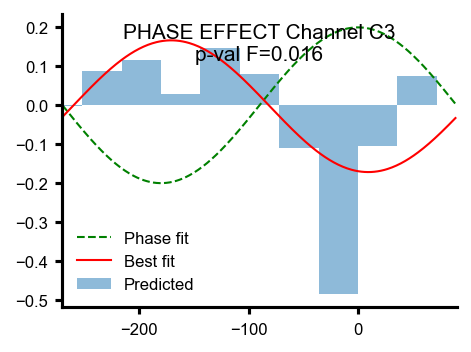

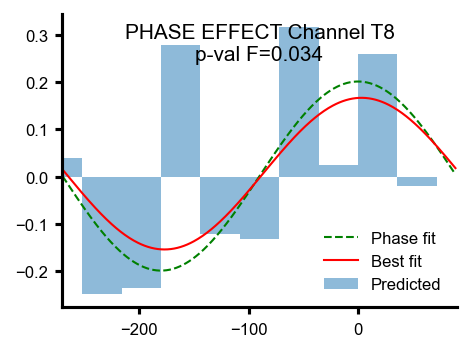

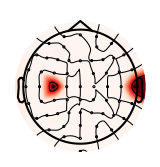

In [44]:
significant_alpha_channels_subj2 = plot_significant_phase_effects(ch_names_subj2, data_EEG_subj2["alpha"], pred_label_subj2, degree_bins, freq_band="alpha")
ch_data = np.zeros(len(ch_names))
for idx, ch in enumerate(ch_names):
    if ch in significant_alpha_channels_subj2:
        ch_data[idx] = 1

    #channels_indices = [ch_names.index(ch) for ch in significant_channels_subj2]
mne.viz.plot_topomap(ch_data, info_subj2, show = False, contours=1, ch_type='eeg')

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
       

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
Significant channels for theta: ['C3', 'O1', 'P8', 'Cz', 'FC1', 'CP6', 'C1', 'FC3', 'P6', 'TP8', 'Oz']
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
Significant channels for alpha: ['C3', 'T8']
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Do

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated


/home/marco/anaconda3/envs/MA_env/lib/python3.11/site-packages/mne/viz/topomap.py:1013: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, axes = plt.subplots(figsize=(size, size), layout="constrained")


Significant channels for beta: ['C4', 'T8', 'PO3', 'C6', 'PO7']
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preproce

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
Significant channels for gamma: ['P3']


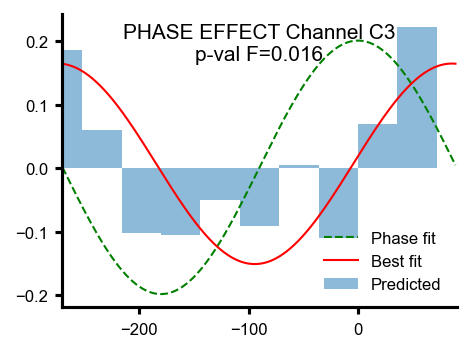

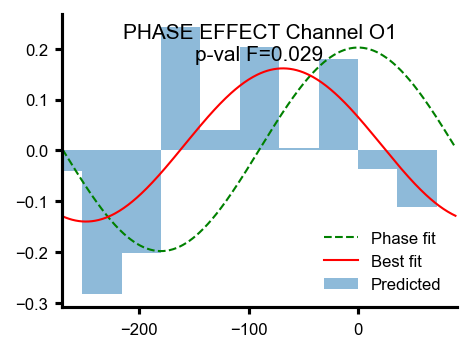

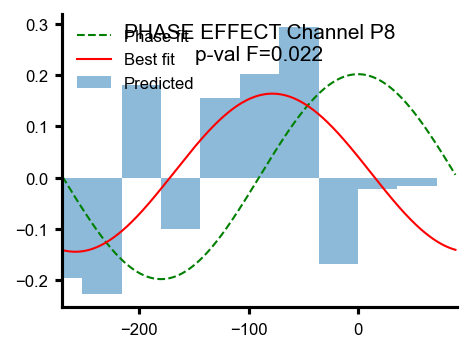

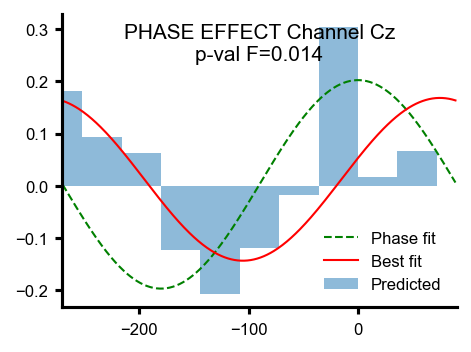

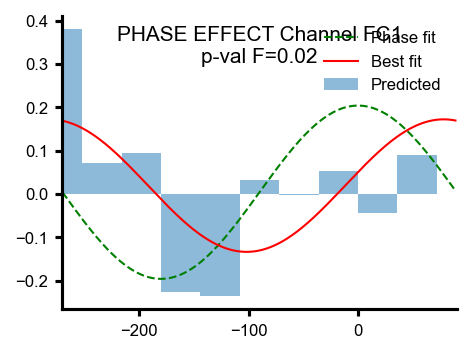

...

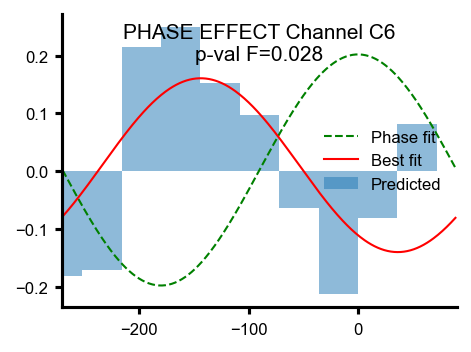

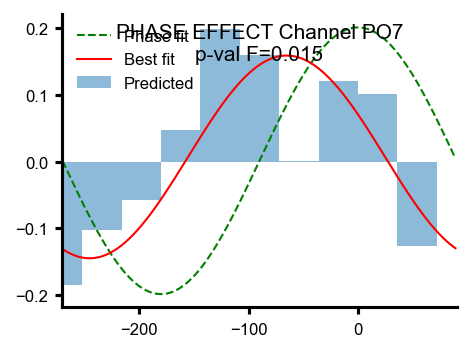

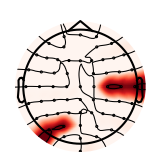

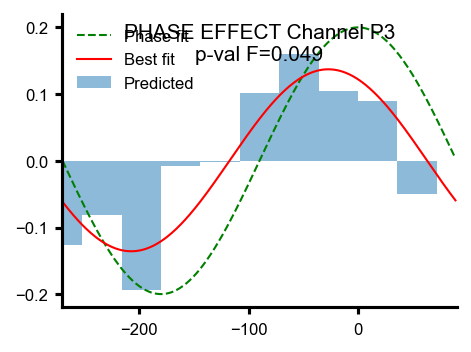

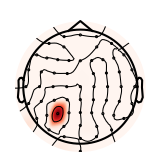

In [45]:
freq_bands = ["theta", "alpha", "beta", "gamma"]
ch_names
for freq_band in freq_bands:
    data_EEG_subj2, pred_label_subj2, ch_names_subj2, ch_indices_subj2, info_subj2 = load_data_for_subject(2)
    significant_channels_subj2 = plot_significant_phase_effects(ch_names_subj2, data_EEG_subj2[freq_band], pred_label_subj2, degree_bins, freq_band=freq_band)

    ch_data = np.zeros(len(ch_names))
    for idx, ch in enumerate(ch_names):
        if ch in significant_channels_subj2:
            ch_data[idx] = 1

    #channels_indices = [ch_names.index(ch) for ch in significant_channels_subj2]
    mne.viz.plot_topomap(ch_data, info_subj2, show = False, contours=1, ch_type='eeg')
    print(f"Significant channels for {freq_band}: {significant_channels_subj2 }")

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 1
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_1_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif ...


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated


/tmp/ipykernel_33834/3306391441.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots()


wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
       

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 13
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_13_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_013_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
633 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_013_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_013_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
633 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 24
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_24_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_024_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
535 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_024_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_024_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
535 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 29
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_29_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_029_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
731 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_029_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_029_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
731 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 34
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_34_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_034_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
784 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_034_preprocessed_combined_py.fif ...


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_034_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
784 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 42
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_042_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
788 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_042_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_042_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
788 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 43
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_43_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_043_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
727 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_043_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_043_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
727 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 52
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_52_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_052_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
654 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_052_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_052_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
654 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 60
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_60_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_060_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
752 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_060_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_060_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
752 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 62
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_62_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_062_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available
Adding metadata with 1 columns
773 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_062_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_062_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
773 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 67
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_67_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_067_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
646 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_067_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_067_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
646 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 69
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_69_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_069_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
599 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_069_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_069_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
599 matching events found
No baseline correction applied
0 projection items activated
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 80
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 0
  num_epochs: 800
  slide_step: 1
  num_warmup_epochs_per_window: 0
  lr: 0.005
  nll_beta: 0.001
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_80_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_p

/home/marco/Documents/GitHub/tms_eeg_decoding/Pulse_phase_eval/data/data_loader.py:38: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_080_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
760 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_080_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/tmp/ipykernel_33834/1449200009.py:13: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_080_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path)


Adding metadata with 1 columns
760 matching events found
No baseline correction applied
0 projection items activated


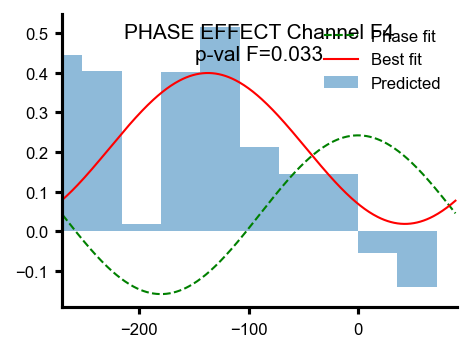

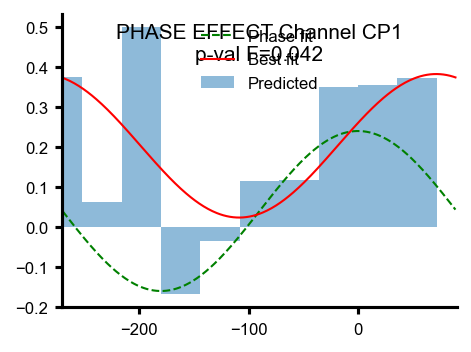

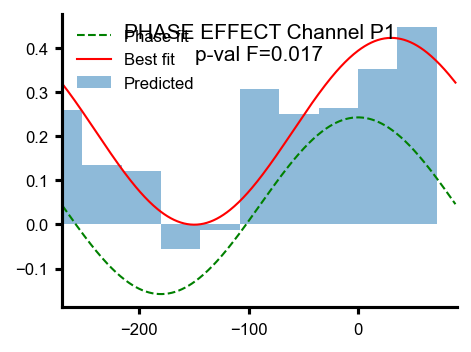

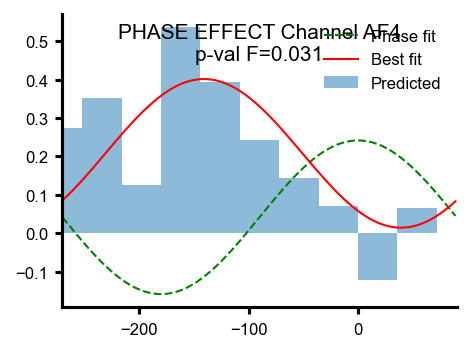

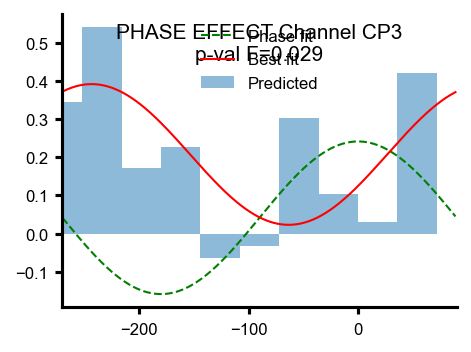

...

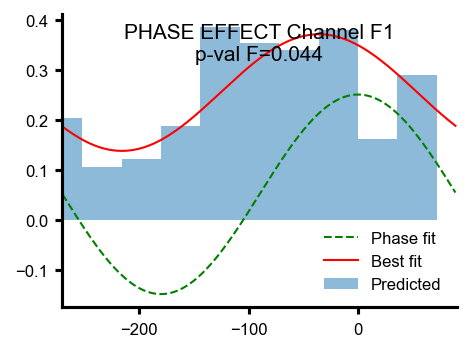

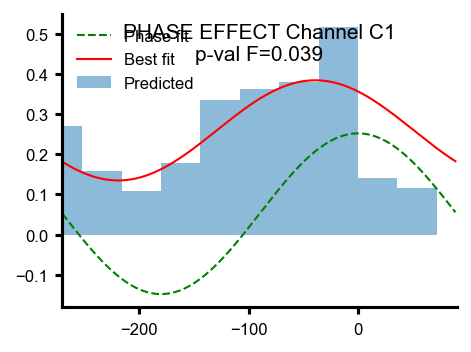

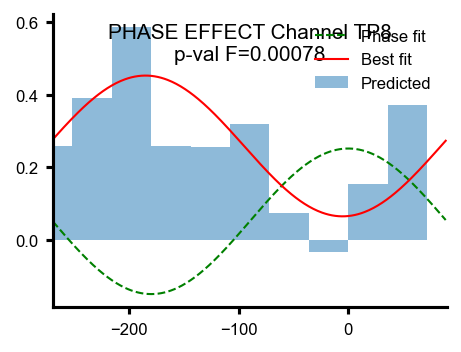

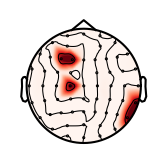

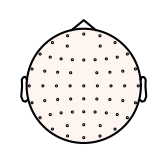

In [46]:
cwd = os.getcwd()
cwd = cwd+"/.."
freq_bands = ["theta", "alpha", "beta", "gamma"]
all_subjects_significant_channels = {si: {fb:[] for fb in freq_bands} for si in cfg.dataset.test_subject_indices}
top_k_per_subject = {si : [] for si in cfg.dataset.test_subject_indices}

for subject_index in cfg.dataset.test_subject_indices:
    
    data_EEG_subj, pred_label_subj, ch_names_subj, channel_indices_subj, info_subj = load_data_for_subject(subject_index)
    channel_indices = np.arange(60)[channel_indices_subj]
    
    info_subj = mne.pick_info(info_subj, sel=channel_indices)
    file_path = os.path.join("/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data",f"gradshap_subject_{subject_index}.npy")
    gradshap = np.load(file_path)
    top_k_channels, channel_point_dicts_individual_trials = get_top_k_weighted_individual({"gradshap": gradshap[:,channel_indices_subj]}, "gradshap", ch_names_subj, 10, update_channel_points_linear)
    top_k_per_subject[subject_index] = top_k_channels

    for freq_band in freq_bands:
        significant_channels = plot_significant_phase_effects(ch_names_subj, data_EEG_subj[freq_band], pred_label_subj, degree_bins, subject_index=subject_index, freq_band=freq_band)
        all_subjects_significant_channels[subject_index][freq_band] = significant_channels
        ch_data = np.zeros(len(ch_names_subj))
        for idx, ch in enumerate(ch_names_subj):
            if ch in significant_channels:
                ch_data[idx] = 1
        
        mne.viz.plot_topomap(ch_data, info_subj , show = False, contours=1, ch_type='eeg')

## common channels in gamma freqency band

Subject 1:
Top k channels: ['O1', 'PO7', 'PO3', 'O2', 'Oz', 'FC3', 'CP5', 'Fz', 'PO8', 'Cz']
Significant channels in gamma band: ['AF4', 'PO3', 'P5', 'PO7']
Number of common channels: 2
Ratio: 0.50

Subject 2:
Top k channels: ['C4', 'CP4', 'C6', 'PO8', 'AF7', 'O2', 'F7', 'CP6', 'CP5', 'P2']
Significant channels in gamma band: ['P3']
Number of common channels: 0
Ratio: 0.00

Subject 13:
Top k channels: ['F6', 'POz', 'FC3', 'P4', 'O1', 'Fp1', 'P8', 'CP3', 'O2', 'F8']
Significant channels in gamma band: ['C3', 'C5']
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'P8', 'O2', 'FC2', 'Fz', 'Oz', 'FC1', 'PO7', 'PO8', 'CP4']
Significant channels in gamma band: ['P4', 'T8', 'FC3', 'C5']
Number of common channels: 0
Ratio: 0.00

Subject 29:
Top k channels: ['AF4', 'AF8', 'Fp2', 'F4', 'F1', 'O1', 'F7', 'FC1', 'Fpz', 'AF7']
Significant channels in gamma band: ['C5', 'FT8']
Number of common channels: 0
Ratio: 0.00

Subject 34:
Top k channels: ['AF8', 'F1', 'AF3', 'CP1

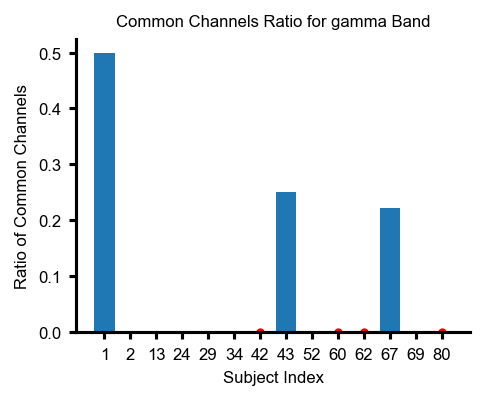

In [50]:
def compare_top_k_and_significant(cfg, top_k_per_subject, all_subjects_significant_channels, frequency_band='gamma'):
    subject_ratios = []
    subject_common_channels = []
    subject_sig_channels = []
    for subject_index in cfg.dataset.test_subject_indices:

        print(f"Subject {subject_index}:")
        print("Top k channels:", top_k_per_subject[subject_index])
        print(f"Significant channels in {frequency_band} band:", all_subjects_significant_channels[subject_index][frequency_band])

        common_channels = set(top_k_per_subject[subject_index]) & set(all_subjects_significant_channels[subject_index][frequency_band])
        num_common_channels = len(common_channels)
        num_significant_channels = len(all_subjects_significant_channels[subject_index][frequency_band])
        denominator = max(1, min(len(top_k_per_subject[subject_index]), len(all_subjects_significant_channels[subject_index][frequency_band])))
        ratio = num_common_channels / denominator
        subject_common_channels.append(num_common_channels)
        subject_ratios.append(ratio)
        subject_sig_channels.append(num_significant_channels)
        print(f"Number of common channels: {num_common_channels}")
        print(f"Ratio: {ratio:.2f}")
        print()
    
    plt.bar(np.arange(len(subject_ratios)), subject_ratios)
    for idx, num_sig in enumerate(subject_sig_channels):
        if num_sig == 0:
            plt.plot(idx, subject_ratios[idx], 'ro')

    plt.xticks(np.arange(len(subject_ratios)), cfg.dataset.test_subject_indices)
    plt.xlabel('Subject Index')
    plt.ylabel('Ratio of Common Channels')
    plt.title(f'Common Channels Ratio for {frequency_band} Band')
    plt.savefig(f'common_channels_ratio_{frequency_band}.png')
    plt.show()

# Example usage:
compare_top_k_and_significant(cfg, top_k_per_subject, all_subjects_significant_channels, frequency_band='gamma')


## common channels in alpha frequency band

Subject 1:
Top k channels: ['O1', 'PO7', 'PO3', 'O2', 'Oz', 'FC3', 'CP5', 'Fz', 'PO8', 'Cz']
Significant channels in alpha band: ['Fp2', 'F3', 'C3', 'P3', 'Fz', 'Pz', 'FC1', 'CP1', 'CP5', 'F1', 'F2', 'C1', 'P1', 'AF3', 'FC4', 'CP3', 'F5', 'P5', 'Fpz', 'CPz']
Number of common channels: 2
Ratio: 0.20

Subject 2:
Top k channels: ['C4', 'CP4', 'C6', 'PO8', 'AF7', 'O2', 'F7', 'CP6', 'CP5', 'P2']
Significant channels in alpha band: ['C3', 'T8']
Number of common channels: 0
Ratio: 0.00

Subject 13:
Top k channels: ['F6', 'POz', 'FC3', 'P4', 'O1', 'Fp1', 'P8', 'CP3', 'O2', 'F8']
Significant channels in alpha band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'P8', 'O2', 'FC2', 'Fz', 'Oz', 'FC1', 'PO7', 'PO8', 'CP4']
Significant channels in alpha band: []
Number of common channels: 0
Ratio: 0.00

Subject 29:
Top k channels: ['AF4', 'AF8', 'Fp2', 'F4', 'F1', 'O1', 'F7', 'FC1', 'Fpz', 'AF7']
Significant channels in alpha band: ['T7', 'C5', 'TP7', 'PO8', 'CPz']


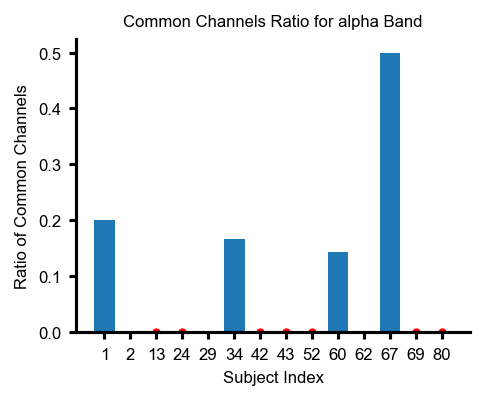

In [51]:
compare_top_k_and_significant(cfg, top_k_per_subject, all_subjects_significant_channels, frequency_band='alpha')

## common channels in beta frequency band

Subject 1:
Top k channels: ['O1', 'PO7', 'PO3', 'O2', 'Oz', 'FC3', 'CP5', 'Fz', 'PO8', 'Cz']
Significant channels in beta band: []
Number of common channels: 0
Ratio: 0.00

Subject 2:
Top k channels: ['C4', 'CP4', 'C6', 'PO8', 'AF7', 'O2', 'F7', 'CP6', 'CP5', 'P2']
Significant channels in beta band: ['C4', 'T8', 'PO3', 'C6', 'PO7']
Number of common channels: 2
Ratio: 0.40

Subject 13:
Top k channels: ['F6', 'POz', 'FC3', 'P4', 'O1', 'Fp1', 'P8', 'CP3', 'O2', 'F8']
Significant channels in beta band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'P8', 'O2', 'FC2', 'Fz', 'Oz', 'FC1', 'PO7', 'PO8', 'CP4']
Significant channels in beta band: ['Fp1', 'T8', 'P7', 'P8', 'AF3', 'F5', 'P5', 'AF7', 'FT8', 'TP8', 'PO7', 'Oz']
Number of common channels: 4
Ratio: 0.40

Subject 29:
Top k channels: ['AF4', 'AF8', 'Fp2', 'F4', 'F1', 'O1', 'F7', 'FC1', 'Fpz', 'AF7']
Significant channels in beta band: ['CP1', 'PO7']
Number of common channels: 0
Ratio: 0.00

Subject 34:
T

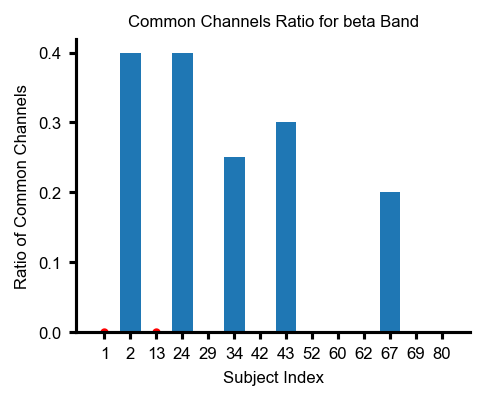

In [52]:
compare_top_k_and_significant(cfg, top_k_per_subject, all_subjects_significant_channels, frequency_band='beta')

## common channels in theta frequency band

Subject 1:
Top k channels: ['O1', 'PO7', 'PO3', 'O2', 'Oz', 'FC3', 'CP5', 'Fz', 'PO8', 'Cz']
Significant channels in theta band: ['F4', 'CP1', 'P1', 'AF4', 'CP3', 'F6', 'FT8']
Number of common channels: 0
Ratio: 0.00

Subject 2:
Top k channels: ['C4', 'CP4', 'C6', 'PO8', 'AF7', 'O2', 'F7', 'CP6', 'CP5', 'P2']
Significant channels in theta band: ['C3', 'O1', 'P8', 'Cz', 'FC1', 'CP6', 'C1', 'FC3', 'P6', 'TP8', 'Oz']
Number of common channels: 1
Ratio: 0.10

Subject 13:
Top k channels: ['F6', 'POz', 'FC3', 'P4', 'O1', 'Fp1', 'P8', 'CP3', 'O2', 'F8']
Significant channels in theta band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'P8', 'O2', 'FC2', 'Fz', 'Oz', 'FC1', 'PO7', 'PO8', 'CP4']
Significant channels in theta band: ['Fp1', 'Fp2', 'F3', 'F4', 'C4', 'O1', 'F8', 'P7', 'P8', 'FC1', 'CP6', 'F1', 'C2', 'AF4', 'FC3', 'FC4', 'CP4', 'F6', 'C6', 'P5', 'AF8', 'TP8', 'PO8']
Number of common channels: 5
Ratio: 0.50

Subject 29:
Top k channels: ['AF4', 'AF8', 

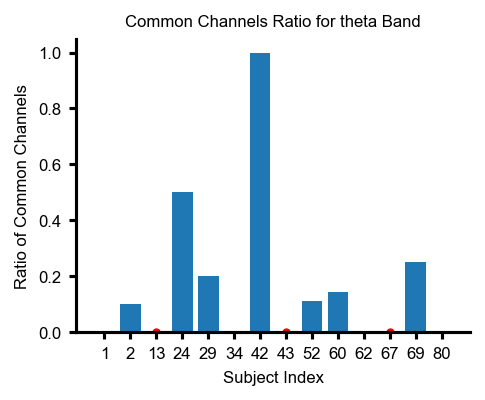

In [53]:
compare_top_k_and_significant(cfg, top_k_per_subject, all_subjects_significant_channels, frequency_band='theta')